## **PARALLEL** **VISION** **TRANSFORMER**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files
files.upload()  # Upload your kaggle.json file here

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"liucifer","key":"b2010fa5c8ccbc81fd5cdbecb50fa431"}'}

# **Dataset** **collection**

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d xhlulu/140k-real-and-fake-faces
!unzip 140k-real-and-fake-faces.zip -d dataset_folder

Streaming output truncated to the last 5000 lines.
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34832.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34836.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34839.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34847.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34848.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34852.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34861.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34864.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34868.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34877.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34883.jpg  
  inflating: dataset_folder/real_vs_fake/real-vs-fake/valid/real/34887.jpg  
  inflating: dataset_fold

# **Dataset Preprocessing**

In [ ]:
!pip install torch torchvision einops vit-pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.4/122.4 kB 7.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylin

In [ ]:
# Check GPU
import torch
print(torch.cuda.get_device_name(0))
print(f"Memory Allocated: {torch.cuda.memory_allocated(0)/1024**3:.2f} GB")
print(f"Memory Cached: {torch.cuda.memory_reserved(0)/1024**3:.2f} GB")

NVIDIA L4
Memory Allocated: 0.00 GB
Memory Cached: 0.00 GB


In [ ]:
import torch
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

# Data preparation
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomCrop(224),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

train_dataset = datasets.ImageFolder(root="/content/dataset_folder/real_vs_fake/real-vs-fake/train", transform=transform)
val_dataset = datasets.ImageFolder(root="/content/dataset_folder/real_vs_fake/real-vs-fake/valid", transform=transform)
test_dataset = datasets.ImageFolder(root="/content/dataset_folder/real_vs_fake/real-vs-fake/test", transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=8, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=8, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=8, pin_memory=True)


# **PARALLEL VISION** **TRANSFORMER** model

In [ ]:
import torch
from torch import nn

from einops import rearrange, repeat
from einops.layers.torch import Rearrange

# helpers

def pair(t):
    return t if isinstance(t, tuple) else (t, t)

# classes

class Parallel(nn.Module):
    def __init__(self, *fns):
        super().__init__()
        self.fns = nn.ModuleList(fns)

    def forward(self, x):
        return sum([fn(x) for fn in self.fns])

class FeedForward(nn.Module):
    def __init__(self, dim, hidden_dim, dropout = 0.):
        super().__init__()
        self.net = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, dim),
            nn.Dropout(dropout)
        )
    def forward(self, x):
        return self.net(x)

class Attention(nn.Module):
    def __init__(self, dim, heads = 8, dim_head = 64, dropout = 0.):
        super().__init__()
        inner_dim = dim_head *  heads
        project_out = not (heads == 1 and dim_head == dim)

        self.heads = heads
        self.scale = dim_head ** -0.5

        self.norm = nn.LayerNorm(dim)
        self.attend = nn.Softmax(dim = -1)
        self.dropout = nn.Dropout(dropout)

        self.to_qkv = nn.Linear(dim, inner_dim * 3, bias = False)

        self.to_out = nn.Sequential(
            nn.Linear(inner_dim, dim),
            nn.Dropout(dropout)
        ) if project_out else nn.Identity()

    def forward(self, x):
        x = self.norm(x)
        qkv = self.to_qkv(x).chunk(3, dim = -1)
        q, k, v = map(lambda t: rearrange(t, 'b n (h d) -> b h n d', h = self.heads), qkv)

        dots = torch.matmul(q, k.transpose(-1, -2)) * self.scale

        attn = self.attend(dots)
        attn = self.dropout(attn)

        out = torch.matmul(attn, v)
        out = rearrange(out, 'b h n d -> b n (h d)')
        return self.to_out(out)

class Transformer(nn.Module):
    def __init__(self, dim, depth, heads, dim_head, mlp_dim, num_parallel_branches = 2, dropout = 0.):
        super().__init__()
        self.layers = nn.ModuleList([])

        attn_block = lambda: Attention(dim, heads = heads, dim_head = dim_head, dropout = dropout)
        ff_block = lambda: FeedForward(dim, mlp_dim, dropout = dropout)

        for _ in range(depth):
            self.layers.append(nn.ModuleList([
                Parallel(*[attn_block() for _ in range(num_parallel_branches)]),
                Parallel(*[ff_block() for _ in range(num_parallel_branches)]),
            ]))

    def forward(self, x):
        for attns, ffs in self.layers:
            x = attns(x) + x
            x = ffs(x) + x
        return x

class ViT(nn.Module):
    def __init__(self, *, image_size, patch_size, num_classes, dim, depth, heads, mlp_dim, pool = 'cls', num_parallel_branches = 2, channels = 3, dim_head = 64, dropout = 0., emb_dropout = 0.):
        super().__init__()
        image_height, image_width = pair(image_size)
        patch_height, patch_width = pair(patch_size)

        assert image_height % patch_height == 0 and image_width % patch_width == 0, 'Image dimensions must be divisible by the patch size.'

        num_patches = (image_height // patch_height) * (image_width // patch_width)
        patch_dim = channels * patch_height * patch_width
        assert pool in {'cls', 'mean'}, 'pool type must be either cls (cls token) or mean (mean pooling)'

        self.to_patch_embedding = nn.Sequential(
            Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1 = patch_height, p2 = patch_width),
            nn.Linear(patch_dim, dim),
        )

        self.pos_embedding = nn.Parameter(torch.randn(1, num_patches + 1, dim))
        self.cls_token = nn.Parameter(torch.randn(1, 1, dim))
        self.dropout = nn.Dropout(emb_dropout)

        self.transformer = Transformer(dim, depth, heads, dim_head, mlp_dim, num_parallel_branches, dropout)

        self.pool = pool
        self.to_latent = nn.Identity()

        self.mlp_head = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, num_classes)
        )

    def forward(self, img):
        x = self.to_patch_embedding(img)
        b, n, _ = x.shape

        cls_tokens = repeat(self.cls_token, '() n d -> b n d', b = b)
        x = torch.cat((cls_tokens, x), dim=1)
        x += self.pos_embedding[:, :(n + 1)]
        x = self.dropout(x)

        x = self.transformer(x)

        x = x.mean(dim = 1) if self.pool == 'mean' else x[:, 0]

        x = self.to_latent(x)
        return self.mlp_head(x)

In [ ]:
from vit_pytorch.parallel_vit import ViT

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the model
model = ViT(
    image_size=224,
    patch_size=16,
    num_classes=2,
    dim=768,
    depth=6,
    heads=12,
    mlp_dim=2048,
    num_parallel_branches=2,
    dropout=0.1,
    emb_dropout=0.1
).to(device)

# Print the model architecture
print(model)


ViT(
  (to_patch_embedding): Sequential(
    (0): Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=16, p2=16)
    (1): Linear(in_features=768, out_features=768, bias=True)
  )
  (dropout): Dropout(p=0.1, inplace=False)
  (transformer): Transformer(
    (layers): ModuleList(
      (0-5): 6 x ModuleList(
        (0): Parallel(
          (fns): ModuleList(
            (0-1): 2 x Attention(
              (norm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
              (attend): Softmax(dim=-1)
              (dropout): Dropout(p=0.1, inplace=False)
              (to_qkv): Linear(in_features=768, out_features=2304, bias=False)
              (to_out): Sequential(
                (0): Linear(in_features=768, out_features=768, bias=True)
                (1): Dropout(p=0.1, inplace=False)
              )
            )
          )
        )
        (1): Parallel(
          (fns): ModuleList(
            (0-1): 2 x FeedForward(
              (net): Sequential(
                (0):

# **Training model**

In [ ]:
import torch.optim as optim
import torch.nn as nn
from torch.cuda.amp import GradScaler, autocast
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
scheduler = ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)

# Mixed Precision Training
scaler = GradScaler()

num_epochs = 50
best_val_loss = float('inf')
early_stopping_patience = 10
early_stopping_counter = 0
accumulation_steps = 4  # Effective batch size will be batch_size * accumulation_steps

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    optimizer.zero_grad()

    for i, (images, labels) in enumerate(train_loader):
        images, labels = images.to(device), labels.to(device)

        with autocast():
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss = loss / accumulation_steps  # Normalize the loss

        scaler.scale(loss).backward()

        if (i + 1) % accumulation_steps == 0:
            # Gradient clipping
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

    running_loss += loss.item() * images.size(0) * accumulation_steps  # Correct the accumulated loss

    epoch_loss = running_loss / len(train_loader.dataset)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

    model.eval()
    val_running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            val_loss = criterion(outputs, labels)
            val_running_loss += val_loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss = val_running_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")

    scheduler.step(val_loss)

    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'best_model.pth')
        early_stopping_counter = 0
    else:
        early_stopping_counter += 1
        if early_stopping_counter >= early_stopping_patience:
            print("Early stopping triggered")
            break


Epoch [1/50], Loss: 0.0002
Validation Loss: 0.6363, Validation Accuracy: 63.84%
Epoch [2/50], Loss: 0.0002
Validation Loss: 0.6167, Validation Accuracy: 66.00%
Epoch [3/50], Loss: 0.0002
Validation Loss: 0.5932, Validation Accuracy: 68.03%
Epoch [4/50], Loss: 0.0002
Validation Loss: 0.5811, Validation Accuracy: 69.28%
Epoch [5/50], Loss: 0.0002
Validation Loss: 0.5717, Validation Accuracy: 69.90%
Epoch [6/50], Loss: 0.0002
Validation Loss: 0.5808, Validation Accuracy: 69.97%
Epoch [7/50], Loss: 0.0001
Validation Loss: 0.5400, Validation Accuracy: 72.50%
Epoch [8/50], Loss: 0.0002
Validation Loss: 0.5308, Validation Accuracy: 73.16%
Epoch [9/50], Loss: 0.0002
Validation Loss: 0.5289, Validation Accuracy: 73.89%
Epoch [10/50], Loss: 0.0002
Validation Loss: 0.5225, Validation Accuracy: 74.69%
Epoch [11/50], Loss: 0.0001
Validation Loss: 0.5082, Validation Accuracy: 75.33%
Epoch [12/50], Loss: 0.0001
Validation Loss: 0.4972, Validation Accuracy: 75.74%
Epoch [13/50], Loss: 0.0002
Validatio

# **Testing and Evaluating model**

In [ ]:
import torch.optim as optim
import torch.nn as nn
from torch.cuda.amp import GradScaler, autocast
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
scheduler = ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)

# Mixed Precision Training
scaler = GradScaler()

In [ ]:
model.load_state_dict(torch.load('/content/drive/MyDrive/Trained model/best_model.pth'))
model.eval()

test_running_loss = 0.0
correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        test_loss = criterion(outputs, labels)
        test_running_loss += test_loss.item() * images.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

test_loss = test_running_loss / len(test_loader.dataset)
test_accuracy = 100 * correct / total
print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%")


Test Loss: 0.2117, Test Accuracy: 91.55%


In [ ]:
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Load the best model
model.load_state_dict(torch.load('/content/drive/MyDrive/Trained model/best_model.pth'))
model.eval()

# Initialize lists to store labels and predictions
all_labels = []
all_preds = []
all_probs = []

# Evaluation on the test dataset
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        probs = torch.softmax(outputs, dim=1)[:, 1]

        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())

# Compute metrics
accuracy = accuracy_score(all_labels, all_preds) * 100
precision = precision_score(all_labels, all_preds, average='binary') * 100
recall = recall_score(all_labels, all_preds, average='binary') * 100
f1 = f1_score(all_labels, all_preds, average='binary') * 100
auc = roc_auc_score(all_labels, all_probs) * 100

print(f"Test Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Recall: {recall:.2f}%")
print(f"F1 Score: {f1:.2f}%")
print(f"AUC: {auc:.2f}%")


Test Accuracy: 91.86%
Precision: 94.85%
Recall: 88.53%
F1 Score: 91.58%
AUC: 97.82%


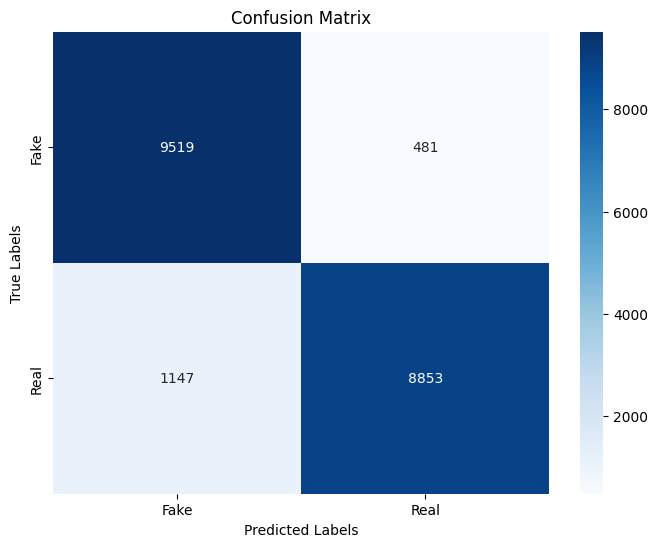

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Plotting the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Fake', 'Real'], yticklabels=['Fake', 'Real'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


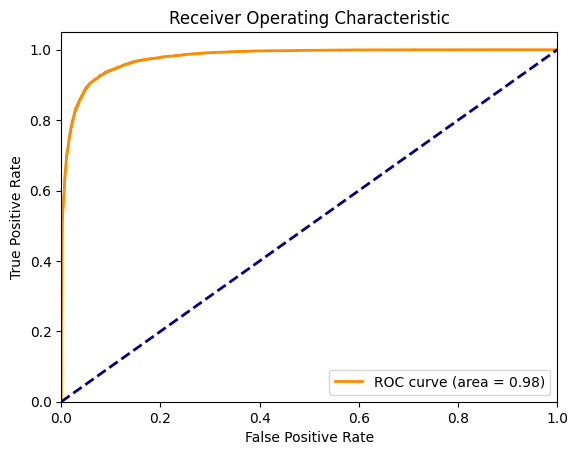

In [ ]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(all_labels, all_probs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


In [ ]:
import torch
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import random


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
# Define data transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),           # Convert images to PyTorch tensors
    # No normalization here
])

# Load the training and testing dataset from folders
train_dataset = ImageFolder(root="/content/dataset_folder/real_vs_fake/real-vs-fake/train", transform=transform)
test_dataset = ImageFolder(root="/content/dataset_folder/real_vs_fake/real-vs-fake/test", transform=transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


Training Dataset Examples:


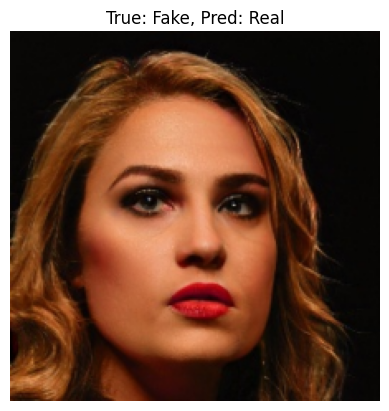

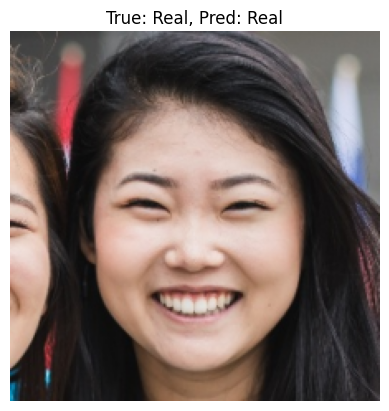

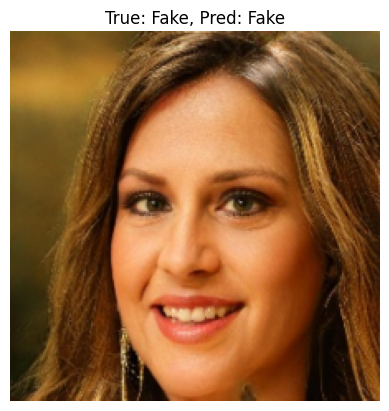

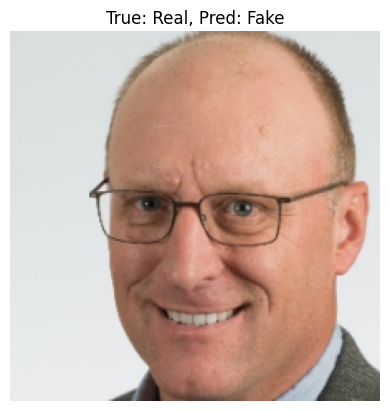

Testing Dataset Examples:


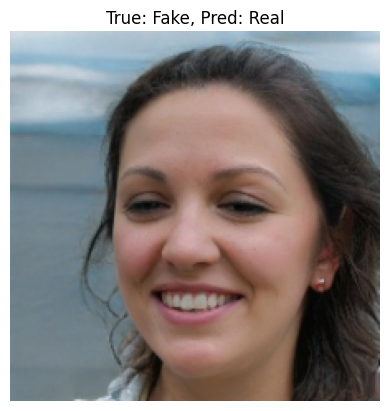

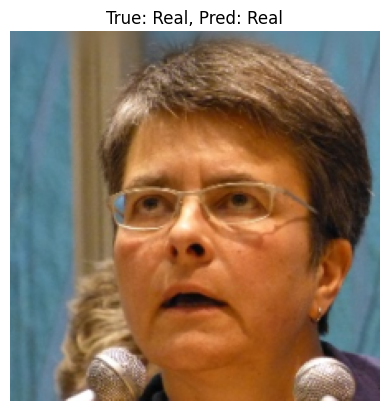

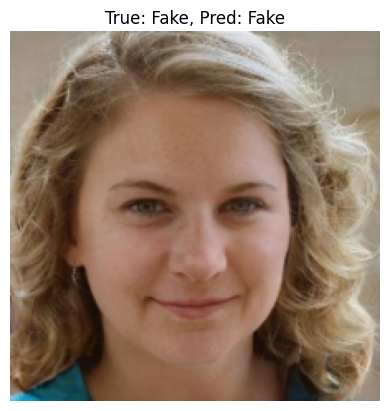

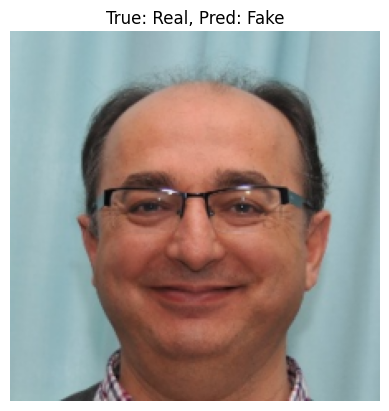

In [ ]:
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import random

# Function to show specific examples
def show_random_example(dataloader, model, device, num_examples=1):
    model.eval()
    examples_shown = {
        'Real-Real': 0,
        'Real-Fake': 0,
        'Fake-Real': 0,
        'Fake-Fake': 0
    }

    categories = {
        (1, 1): 'Real-Real',
        (1, 0): 'Real-Fake',
        (0, 1): 'Fake-Real',
        (0, 0): 'Fake-Fake'
    }

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            for i in range(len(labels)):
                true_label = labels[i].item()
                pred_label = preds[i].item()
                category = categories[(true_label, pred_label)]

                if examples_shown[category] < num_examples:
                    image = images[i].cpu().permute(1, 2, 0).numpy()
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title(f'True: {"Real" if true_label == 1 else "Fake"}, Pred: {"Real" if pred_label == 1 else "Fake"}')
                    plt.show()
                    examples_shown[category] += 1

                if all(count >= num_examples for count in examples_shown.values()):
                    return  # Show only num_examples examples per category

# Load the trained model
model.load_state_dict(torch.load('/content/drive/MyDrive/Trained model/best_model.pth'))
model.eval()

# Shuffle dataset to ensure different images each time
random_seed = random.randint(0, 10000)
torch.manual_seed(random_seed)

print("Training Dataset Examples:")
train_loader_shuffled = DataLoader(train_dataset, batch_size=32, shuffle=True)
show_random_example(train_loader_shuffled, model, device, num_examples=1)

print("Testing Dataset Examples:")
test_loader_shuffled = DataLoader(test_dataset, batch_size=32, shuffle=True)
show_random_example(test_loader_shuffled, model, device, num_examples=1)


Number of images in the training dataset: 100000
Number of images in the testing dataset: 20000
Training Dataset Examples:


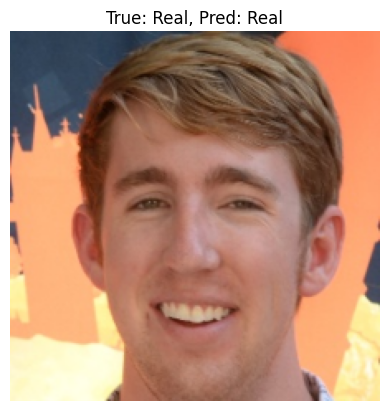

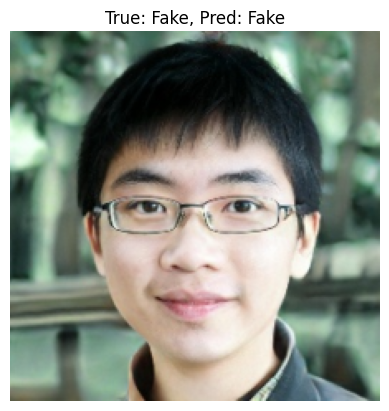

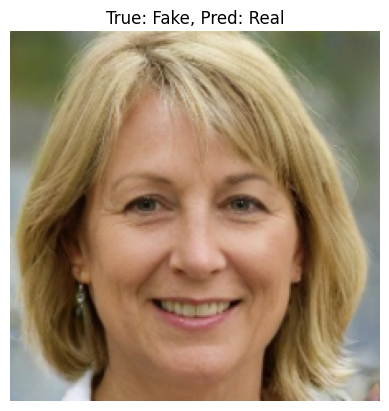

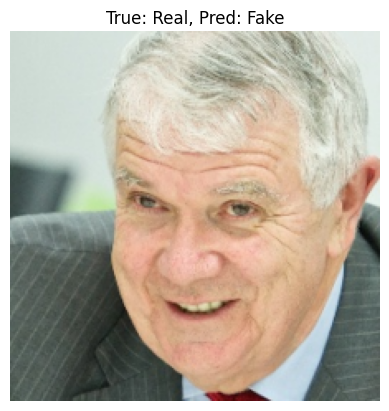

Total images processed from this dataset: 96
Testing Dataset Examples:


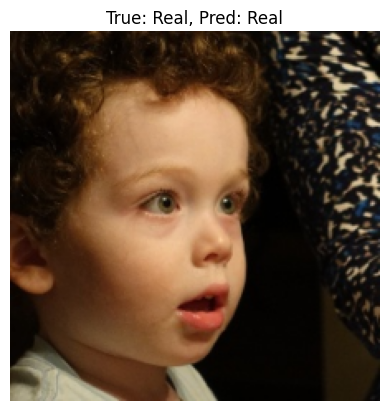

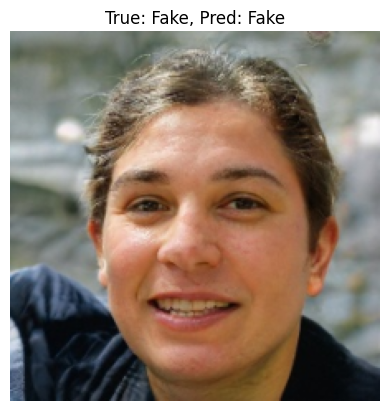

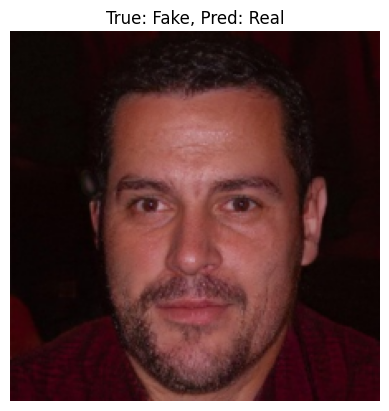

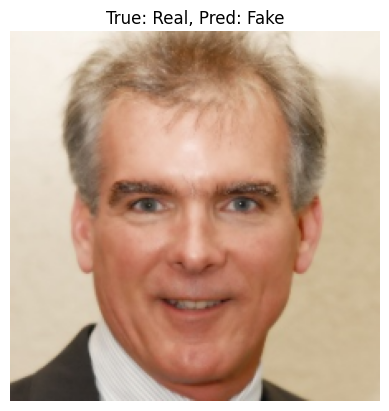

Total images processed from this dataset: 32


In [ ]:
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import random

# Function to show specific examples and count processed images
def show_random_example(dataloader, model, device, num_examples=1):
    model.eval()
    examples_shown = {
        'Real-Real': 0,
        'Real-Fake': 0,
        'Fake-Real': 0,
        'Fake-Fake': 0
    }

    categories = {
        (1, 1): 'Real-Real',
        (1, 0): 'Real-Fake',
        (0, 1): 'Fake-Real',
        (0, 0): 'Fake-Fake'
    }

    total_images_processed = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            total_images_processed += len(labels)

            for i in range(len(labels)):
                true_label = labels[i].item()
                pred_label = preds[i].item()
                category = categories[(true_label, pred_label)]

                if examples_shown[category] < num_examples:
                    image = images[i].cpu().permute(1, 2, 0).numpy()
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title(f'True: {"Real" if true_label == 1 else "Fake"}, Pred: {"Real" if pred_label == 1 else "Fake"}')
                    plt.show()
                    examples_shown[category] += 1

                if all(count >= num_examples for count in examples_shown.values()):
                    print(f"Total images processed from this dataset: {total_images_processed}")
                    return  # Show only num_examples examples per category

    print(f"Total images processed from this dataset: {total_images_processed}")

# Load the trained model
model.load_state_dict(torch.load('/content/drive/MyDrive/Trained model/best_model.pth'))
model.eval()

# Shuffle dataset to ensure different images each time
random_seed = random.randint(0, 10000)
torch.manual_seed(random_seed)

# Count the number of images in each dataset
num_train_images = len(train_dataset)
num_test_images = len(test_dataset)

print(f"Number of images in the training dataset: {num_train_images}")
print(f"Number of images in the testing dataset: {num_test_images}")

print("Training Dataset Examples:")
train_loader_shuffled = DataLoader(train_dataset, batch_size=32, shuffle=True)
show_random_example(train_loader_shuffled, model, device, num_examples=1)

print("Testing Dataset Examples:")
test_loader_shuffled = DataLoader(test_dataset, batch_size=32, shuffle=True)
show_random_example(test_loader_shuffled, model, device, num_examples=1)


Number of images in the training dataset: 100000
Number of images in the testing dataset: 20000
Training Dataset Examples:


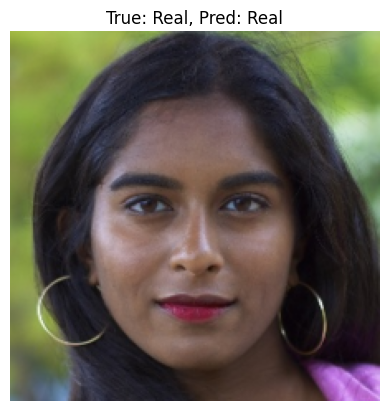

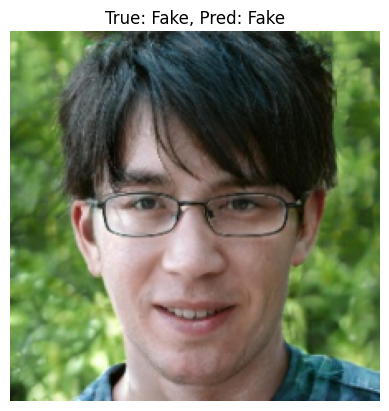

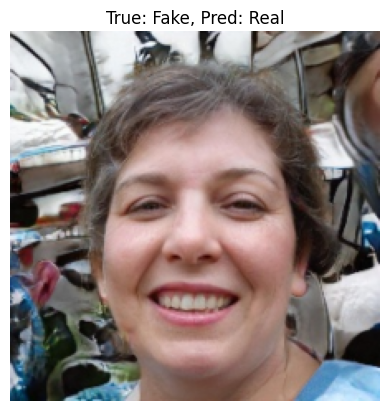

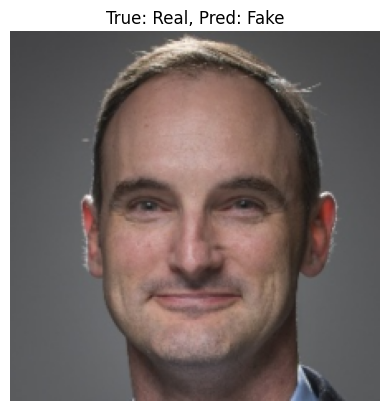

Total images processed from this dataset: 128
Testing Dataset Examples:


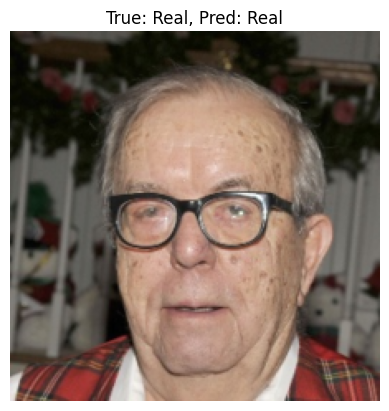

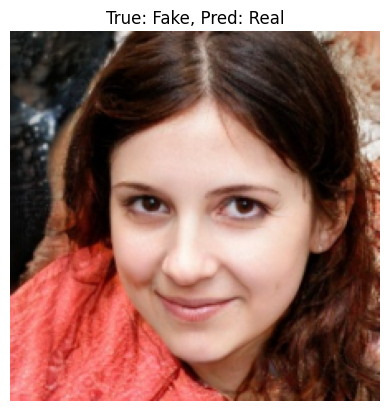

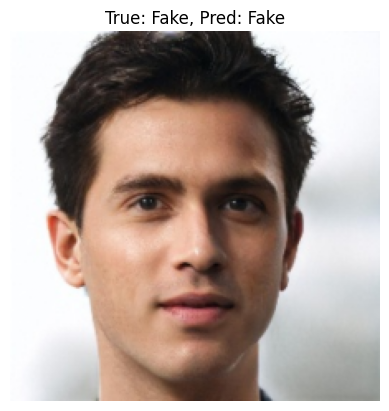

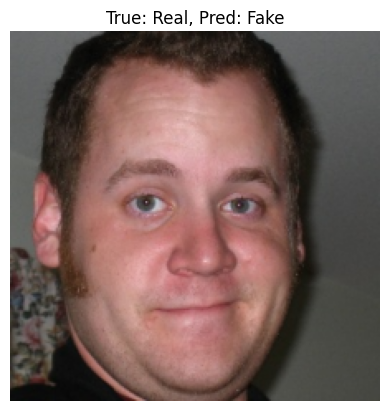

Total images processed from this dataset: 64


In [ ]:
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import random

# Function to show specific examples and count processed images
def show_random_example(dataloader, model, device, num_examples=1):
    model.eval()
    examples_shown = {
        'Real-Real': 0,
        'Real-Fake': 0,
        'Fake-Real': 0,
        'Fake-Fake': 0
    }

    categories = {
        (1, 1): 'Real-Real',
        (1, 0): 'Real-Fake',
        (0, 1): 'Fake-Real',
        (0, 0): 'Fake-Fake'
    }

    total_images_processed = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            total_images_processed += len(labels)

            for i in range(len(labels)):
                true_label = labels[i].item()
                pred_label = preds[i].item()
                category = categories[(true_label, pred_label)]

                if examples_shown[category] < num_examples:
                    image = images[i].cpu().permute(1, 2, 0).numpy()
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title(f'True: {"Real" if true_label == 1 else "Fake"}, Pred: {"Real" if pred_label == 1 else "Fake"}')
                    plt.show()
                    examples_shown[category] += 1

                if all(count >= num_examples for count in examples_shown.values()):
                    print(f"Total images processed from this dataset: {total_images_processed}")
                    return  # Show only num_examples examples per category

    print(f"Total images processed from this dataset: {total_images_processed}")

# Load the trained model
model.load_state_dict(torch.load('/content/drive/MyDrive/Trained model/best_model.pth'))
model.eval()

# Shuffle dataset to ensure different images each time
random_seed = random.randint(0, 10000)
torch.manual_seed(random_seed)

# Count the number of images in each dataset
num_train_images = len(train_dataset)
num_test_images = len(test_dataset)

print(f"Number of images in the training dataset: {num_train_images}")
print(f"Number of images in the testing dataset: {num_test_images}")

print("Training Dataset Examples:")
train_loader_shuffled = DataLoader(train_dataset, batch_size=32, shuffle=True)
show_random_example(train_loader_shuffled, model, device, num_examples=1)

print("Testing Dataset Examples:")
test_loader_shuffled = DataLoader(test_dataset, batch_size=32, shuffle=True)
show_random_example(test_loader_shuffled, model, device, num_examples=1)


Number of images in the training dataset: 100000
Number of images in the testing dataset: 20000
Training Dataset Examples:


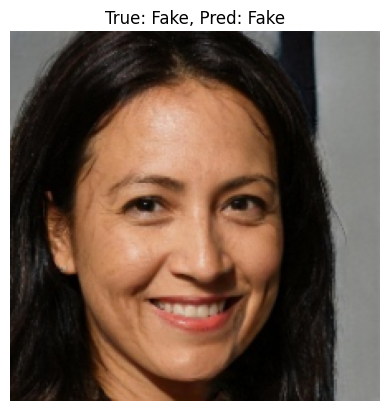

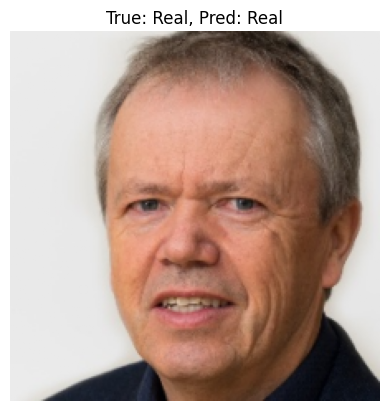

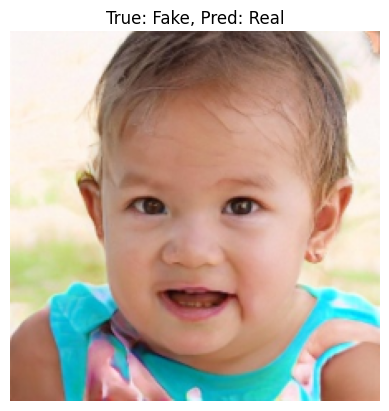

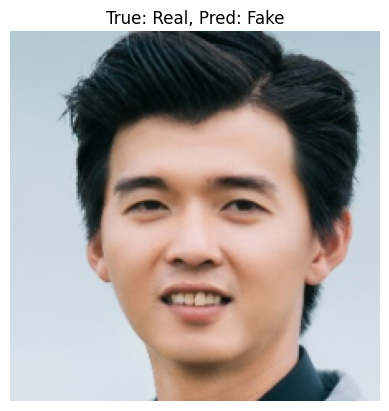

Total images processed from this dataset: 96
Testing Dataset Examples:


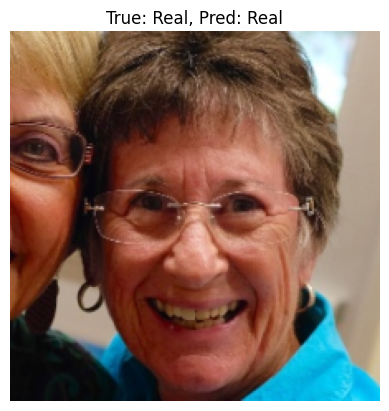

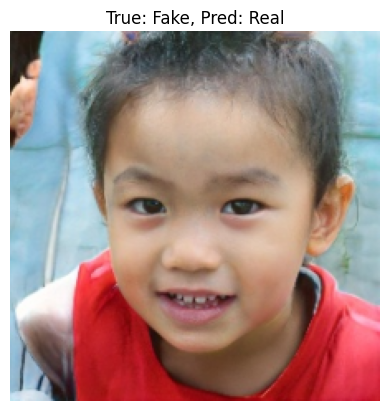

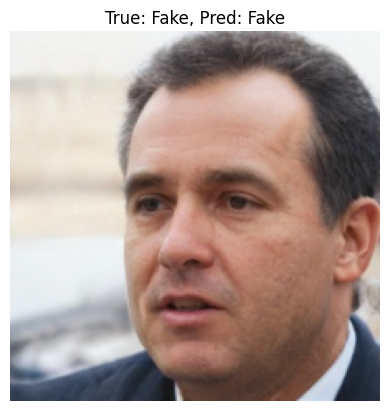

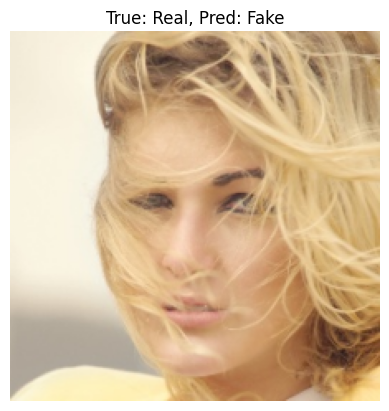

Total images processed from this dataset: 320


In [ ]:
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import random

# Function to show specific examples and count processed images
def show_random_example(dataloader, model, device, num_examples=1):
    model.eval()
    examples_shown = {
        'Real-Real': 0,
        'Real-Fake': 0,
        'Fake-Real': 0,
        'Fake-Fake': 0
    }

    categories = {
        (1, 1): 'Real-Real',
        (1, 0): 'Real-Fake',
        (0, 1): 'Fake-Real',
        (0, 0): 'Fake-Fake'
    }

    total_images_processed = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            total_images_processed += len(labels)

            for i in range(len(labels)):
                true_label = labels[i].item()
                pred_label = preds[i].item()
                category = categories[(true_label, pred_label)]

                if examples_shown[category] < num_examples:
                    image = images[i].cpu().permute(1, 2, 0).numpy()
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title(f'True: {"Real" if true_label == 1 else "Fake"}, Pred: {"Real" if pred_label == 1 else "Fake"}')
                    plt.show()
                    examples_shown[category] += 1

                if all(count >= num_examples for count in examples_shown.values()):
                    print(f"Total images processed from this dataset: {total_images_processed}")
                    return  # Show only num_examples examples per category

    print(f"Total images processed from this dataset: {total_images_processed}")

# Load the trained model
model.load_state_dict(torch.load('/content/drive/MyDrive/Trained model/best_model.pth'))
model.eval()

# Shuffle dataset to ensure different images each time
random_seed = random.randint(0, 10000)
torch.manual_seed(random_seed)

# Count the number of images in each dataset
num_train_images = len(train_dataset)
num_test_images = len(test_dataset)

print(f"Number of images in the training dataset: {num_train_images}")
print(f"Number of images in the testing dataset: {num_test_images}")

print("Training Dataset Examples:")
train_loader_shuffled = DataLoader(train_dataset, batch_size=32, shuffle=True)
show_random_example(train_loader_shuffled, model, device, num_examples=1)

print("Testing Dataset Examples:")
test_loader_shuffled = DataLoader(test_dataset, batch_size=32, shuffle=True)
show_random_example(test_loader_shuffled, model, device, num_examples=1)


Training Dataset Examples:


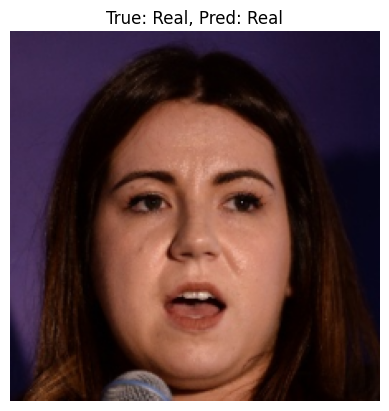

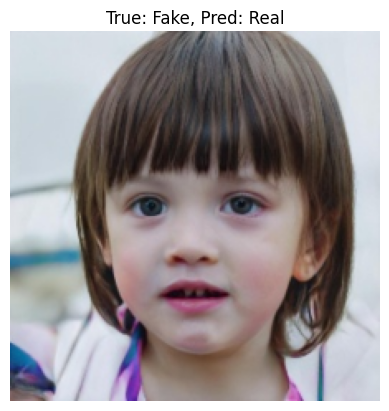

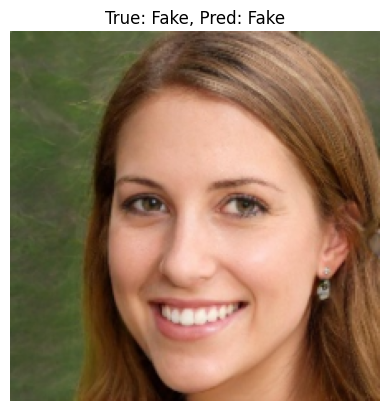

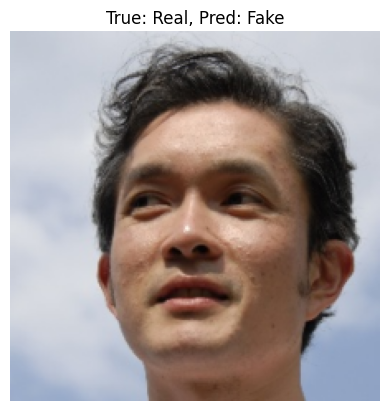

Testing Dataset Examples:


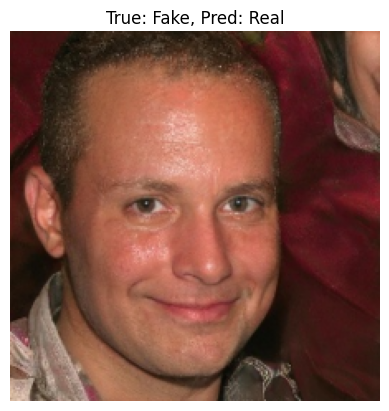

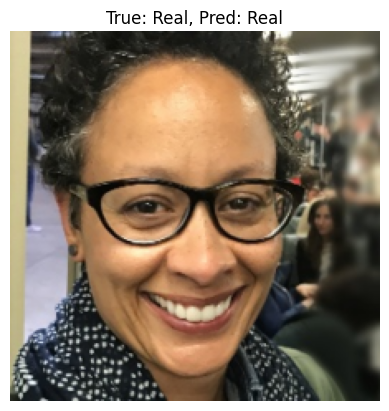

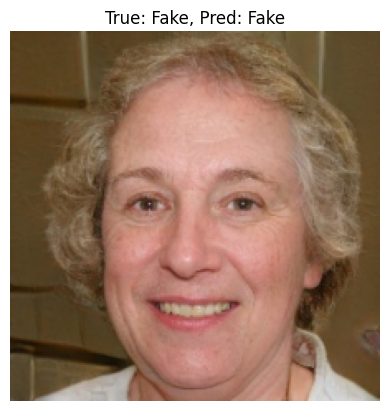

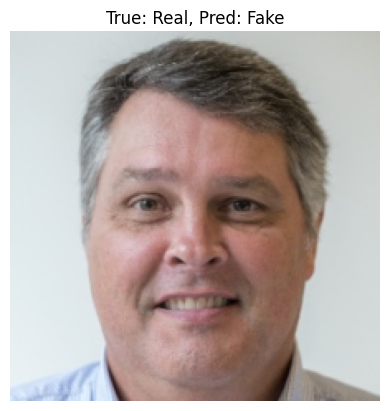

In [ ]:
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import random

# Function to show specific examples
def show_random_example(dataloader, model, device, num_examples=1):
    model.eval()
    examples_shown = {
        'Real-Real': 0,
        'Real-Fake': 0,
        'Fake-Real': 0,
        'Fake-Fake': 0
    }

    categories = {
        (1, 1): 'Real-Real',
        (1, 0): 'Real-Fake',
        (0, 1): 'Fake-Real',
        (0, 0): 'Fake-Fake'
    }

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            for i in range(len(labels)):
                true_label = labels[i].item()
                pred_label = preds[i].item()
                category = categories[(true_label, pred_label)]

                if examples_shown[category] < num_examples:
                    image = images[i].cpu().permute(1, 2, 0).numpy()
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title(f'True: {"Real" if true_label == 1 else "Fake"}, Pred: {"Real" if pred_label == 1 else "Fake"}')
                    plt.show()
                    examples_shown[category] += 1

                if all(count >= num_examples for count in examples_shown.values()):
                    return  # Show only num_examples examples per category

# Load the trained model
model.load_state_dict(torch.load('/content/drive/MyDrive/Trained model/best_model.pth'))
model.eval()

# Shuffle dataset to ensure different images each time
random_seed = random.randint(0, 10000)
torch.manual_seed(random_seed)

print("Training Dataset Examples:")
train_loader_shuffled = DataLoader(train_dataset, batch_size=32, shuffle=True)
show_random_example(train_loader_shuffled, model, device, num_examples=1)

print("Testing Dataset Examples:")
test_loader_shuffled = DataLoader(test_dataset, batch_size=32, shuffle=True)
show_random_example(test_loader_shuffled, model, device, num_examples=1)
